In [41]:
from scipy.io import loadmat
from scipy.stats import circmean, circstd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd

from utils import validate_data

import seaborn as sns
sns.set_theme(style="whitegrid")

## Loading all the data

In [42]:
# Set in stone
data_path = './axej_eeg/'
n_subjects = 13
n_sessions = 4
n_runs = 6
n_trials = 120
n_ts = 500

exp_ts = 1000

# noise frames = 0 to 220 (250 - 30)
noise_thresh = 0.5
noise_gap = 30


experiment_orientations = [159, 123, 87, 51, 15]
subjects = ["01", "02", "03", "04", "05", "06", "07", "08" ,"09", "10", "11", "12", "13"]
subjects_name = ["01", "02", "03", "04", "05", "06", "07", "08" ,"09", "10", "11", "12", "14"]

def get_calib(subj, sess):
    mat_contents = loadmat(data_path + f'AxeJEEG_Subj{subjects_name[subj]}_S{sess+1}_Cali1.mat.mat', struct_as_record=False, squeeze_me=True)
    return mat_contents["p"].__dict__

def get_run(subj, sess, run):
    mat_contents = loadmat(data_path + f'AxeJEEG_Subj{subjects_name[subj]}_S{sess+1}_Run{run+1}.mat.mat', struct_as_record=False, squeeze_me=True)
    return mat_contents["p"].__dict__

In [99]:
# Get all run data
# subjexts x sessions x runs
jx = []
jy = []
stimdir = []
tgonset = []

# Attention (attCue): tr_foc = 1, tr_div = 2
# Coherence (tgCoh): tr_lo = 1, tr_hi = 2
att = []
coh = []

for subj in tqdm(range(n_subjects)):
    for sess in range(n_sessions):
        for run in range(n_runs):

            data = get_run(subj, sess, run)
            jx.append(data["joyx"])
            jy.append(data["joyy"])
            stimdir.append(data["stimDirREAL"])

            f_tgonset = data["f_precuedur"] + data["f_cuedur"]
            tgonset.append(f_tgonset)

            att.append(data["attCue"])
            coh.append(data["tgCoh"])

# Shape the run data
jx = np.array(jx, dtype=np.float64).reshape(n_subjects, n_sessions, n_runs, n_trials, n_ts)
jy = np.array(jy, dtype=np.float64).reshape(n_subjects, n_sessions, n_runs, n_trials, n_ts)
stimdir = np.array(stimdir).reshape(n_subjects, n_sessions, n_runs, n_trials)
tgonset = np.array(tgonset).reshape(n_subjects, n_sessions, n_runs, n_trials)
att = np.array(att).reshape(n_subjects, n_sessions, n_runs, n_trials)
coh = np.array(coh).reshape(n_subjects, n_sessions, n_runs, n_trials)

jx.shape, jy.shape, stimdir.shape, tgonset.shape

100%|██████████| 13/13 [00:00<00:00, 13.75it/s]


((13, 4, 6, 120, 500), (13, 4, 6, 120, 500), (13, 4, 6, 120), (13, 4, 6, 120))

## Logic for Getting Valid Trials:

1. Get all the trials
2. Align all target onset at 250 ts
3. Get distance from center and angle from center
4. If the distance moves <0.4 au n frames before target onset. Then that trial is "too early" and all response set nan.
5. If ts has distance > 1 au then set its response angle to the last valid angle (if first, the nan) and set that distance to 1.
6. get angle first distance = 1 a.u. instance after target onset. or if it never reaches 1, then angle at max distance after target onset. as the response angle.

In [100]:
shifted_jx, shifted_jy, dist_from_cent, resp_angle, final_resp_angles, final_resp_idx = validate_data(n_subjects, n_sessions, n_runs, n_trials, n_ts, exp_ts, jx, jy, tgonset, noise_thresh, noise_gap)

In [101]:
# Get all trials where angles are only nan
nan_trials = np.where(np.isnan(resp_angle).all(axis=-1))
print(nan_trials[0].shape[0], "invalid trials")
print(nan_trials[0].shape[0] / (n_subjects * n_sessions * n_runs * n_trials) * 100, "% invalid trials")

2919 invalid trials
7.7964743589743595 % invalid trials


## Circular stat defs

In [102]:
def circdist(a, b):
    return min(abs(a-b), 360-abs(a-b))

def circmedian(angs):
    angs = np.array(angs)
    angs = angs[~np.isnan(angs)]
    pdists = angs[np.newaxis, :] - angs[:, np.newaxis]
    pdists = (pdists + 180) % (2 * 180) - 180
    pdists = np.abs(pdists).sum(1)
    return angs[np.argmin(pdists)]

In [103]:
calib_median = np.load("circ_median.npy")
median_key = {15:0, 51:1, 87:2, 123:3, 159:4}

In [104]:
calib_std = np.load("circ_std.npy")
std_key = {15:0, 51:1, 87:2, 123:3, 159:4}

## Separating by accuracy

In [105]:
final_resp_angles.shape, stimdir.shape

((13, 4, 6, 120), (13, 4, 6, 120))

In [106]:
# One and two sigma distance from the calibration median

resp_correct_sigma = np.zeros_like(final_resp_angles)
resp_correct_sigma[:] = np.nan

resp_correct_two_sigma = np.zeros_like(final_resp_angles)
resp_correct_two_sigma[:] = np.nan

targ_calib = np.zeros_like(final_resp_angles)
targ_calib[:] = np.nan

nn_neighbor = np.zeros_like(final_resp_angles)
nn_neighbor[:] = np.nan

nn_correct = np.zeros_like(final_resp_angles)
nn_correct[:] = np.nan

resp_err = np.zeros_like(final_resp_angles)
resp_err[:] = np.nan

v_err = np.zeros_like(final_resp_angles)
v_err[:] = np.nan

for subj in range(n_subjects):
    for sess in range(n_sessions):
        for run in range(n_runs):
            for trial in range(n_trials):
                actual_stimdir = stimdir[subj,sess,run,trial]

                # Get the median and std for the actual stimdir
                calib_resp_median = calib_median[subj,median_key[actual_stimdir]]
                calib_resp_sigma = calib_std[subj,std_key[actual_stimdir]]

                # Get the response angle
                trial_response = final_resp_angles[subj,sess,run,trial]

                # Skip if the trial is 'too early'
                if np.isnan(trial_response): continue

                targ_calib[subj,sess,run,trial] = calib_resp_median

                neighbor = min(calib_median[subj], key=lambda x:abs(x-trial_response))
                nn_neighbor[subj,sess,run,trial] = neighbor
                nn_correct[subj,sess,run,trial] = (neighbor == calib_resp_median).astype(int)

                resp_err[subj,sess,run,trial] = circdist(calib_resp_median, trial_response)
                v_err[subj,sess,run,trial] = trial_response - calib_resp_median

                # Check if the response is within 1 sigma or 2 sigma
                resp_correct_sigma[subj,sess,run,trial] = circdist(calib_resp_median, trial_response) <= calib_resp_sigma
                resp_correct_two_sigma[subj,sess,run,trial] = circdist(calib_resp_median, trial_response) <= calib_resp_sigma*2


In [107]:
# replace 1 with -1 and 2 with 1
attention = np.where(att == 2, -1, 1)
coherence = np.where(coh == 1, -1, 1)

expected = np.zeros((n_subjects, n_sessions, n_runs))
expected[:] = np.nan
for subj in range(n_subjects):
    for sess in range(n_sessions):
        for run in range(n_runs - 1):
            vals, counts = np.unique(targ_calib[subj,sess,run], return_counts=True)
            expected[subj,sess,run] = vals[np.argmax(counts)]

# if expected is negative, then do 360 + expected
expected = np.where(expected < 0, 360 + expected, expected)
expected = np.tile(expected.reshape(n_subjects, n_sessions, n_runs, 1), 120)

In [108]:
resp_df = pd.DataFrame({
    "subj": np.repeat(np.arange(n_subjects), n_sessions*n_runs*n_trials),
    "sess": np.tile(np.repeat(np.arange(n_sessions), n_runs*n_trials), n_subjects),
    "run": np.tile(np.repeat(np.arange(n_runs), n_trials), n_subjects*n_sessions),
    "trial": np.tile(np.arange(n_trials), n_subjects*n_sessions*n_runs),
    "target": stimdir.flatten(),
    "t_calib": targ_calib.flatten(),
    "resp": final_resp_angles.flatten(),
    "resp_err": resp_err.flatten(),
    "v_err": v_err.flatten(),
    "exp": expected.flatten(),
    "nn": nn_neighbor.flatten(),
    "1sig": resp_correct_sigma.flatten(),
    "2sig": resp_correct_two_sigma.flatten(),
    "nn_c": nn_correct.flatten(),
    "att": attention.flatten(),
    "coh": coherence.flatten(),
    "exp_al": (expected == targ_calib).astype(int).flatten()
})
# if resp > than t_calib then "higher" else "lower"
resp_df["dir"] = np.where(resp_df["resp"] > resp_df["t_calib"], "higher", "lower")
# resp_df.dropna(inplace=True)
resp_df.round(1).head(10)

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,dir
0,0,0,0,0,159,145.9,150.9,5.0,5.0,145.9,145.9,1.0,1.0,1.0,-1,1,1,higher
1,0,0,0,1,123,138.7,127.9,10.8,-10.8,145.9,138.7,1.0,1.0,1.0,1,1,0,lower
2,0,0,0,2,51,32.9,131.0,98.1,98.1,145.9,138.7,0.0,0.0,0.0,1,1,0,higher
3,0,0,0,3,159,145.9,144.8,1.1,-1.1,145.9,145.9,1.0,1.0,1.0,-1,1,1,lower
4,0,0,0,4,15,18.8,142.8,124.0,124.0,145.9,145.9,0.0,0.0,0.0,-1,-1,0,higher
5,0,0,0,5,159,145.9,140.7,5.2,-5.2,145.9,138.7,1.0,1.0,0.0,-1,-1,1,lower
6,0,0,0,6,159,145.9,127.2,18.7,-18.7,145.9,138.7,0.0,0.0,0.0,-1,-1,1,lower
7,0,0,0,7,159,145.9,12.8,133.1,-133.1,145.9,18.8,0.0,0.0,0.0,1,-1,1,lower
8,0,0,0,8,51,32.9,75.5,42.6,42.6,145.9,64.5,0.0,0.0,0.0,-1,1,0,higher
9,0,0,0,9,159,145.9,129.4,16.5,-16.5,145.9,138.7,0.0,0.0,0.0,-1,-1,1,lower


## Plotting the nn response space

In [53]:
calib_median[0]

array([ 18.75277587,  32.87218544,  64.5476585 , 138.71804387,
       145.87746165])

In [54]:
colors = ["#FFAF00", "#FF0000", "#00FF00", "#0000FF", "#FF00FF"]

In [55]:
def make_edges_widths(centers):
    # Calculate edges as midpoints between centers
    edges = []
    for i in range(len(centers) - 1):
        edges.append((centers[i] + centers[i+1]) / 2)
    edges = np.array(edges)

    # Sort edges and append 0 and 180 for full semi-circle coverage
    sorted_edges = np.sort(edges)
    sorted_edges = np.insert(sorted_edges, 0, 0)  # Add 0 degrees at the start
    sorted_edges = np.append(sorted_edges, 180)  # Add 180 degrees at the end

    # Compute widths for pie slices
    widths = np.diff(sorted_edges)
    return sorted_edges, widths

In [56]:
def vizz_nn(centers, ax=None, title=None):
    centers = np.clip(centers, 0, 180)
    # Adjust centers and edges for a semi-circle
    edges, widths = make_edges_widths(centers)

    if not ax:
        # Plot the semi-circle pie chart with the correct alignment at the top
        fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Adjust theta to start from 0 degrees at the top (aligned with 90 degrees in polar coordinates)
    theta = np.deg2rad(edges[:-1])  # Shift to align 0° at the top

    # Draw the pie chart
    ax.bar(theta, widths, width=np.deg2rad(widths), align='edge', edgecolor='k', bottom=0.5, color=colors)

    ax.set_xticks(np.deg2rad(centers), labels=[f"{center:.1f}°" for center in centers], minor=False)
    # put the tick marks on the x axis

    ax.set_title(title)

    # Adjust polar plot for a top-aligned semi-circle
    ax.set_theta_direction(1)
    ax.set_theta_zero_location("E")
    ax.set_ylim(0, 1.5)
    ax.set_yticklabels([])
    if not ax: plt.show()

In [57]:
centers = np.clip([250, 500], 0, 180)
centers

array([180, 180])

/tmp/ipykernel_2283030/1032441928.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


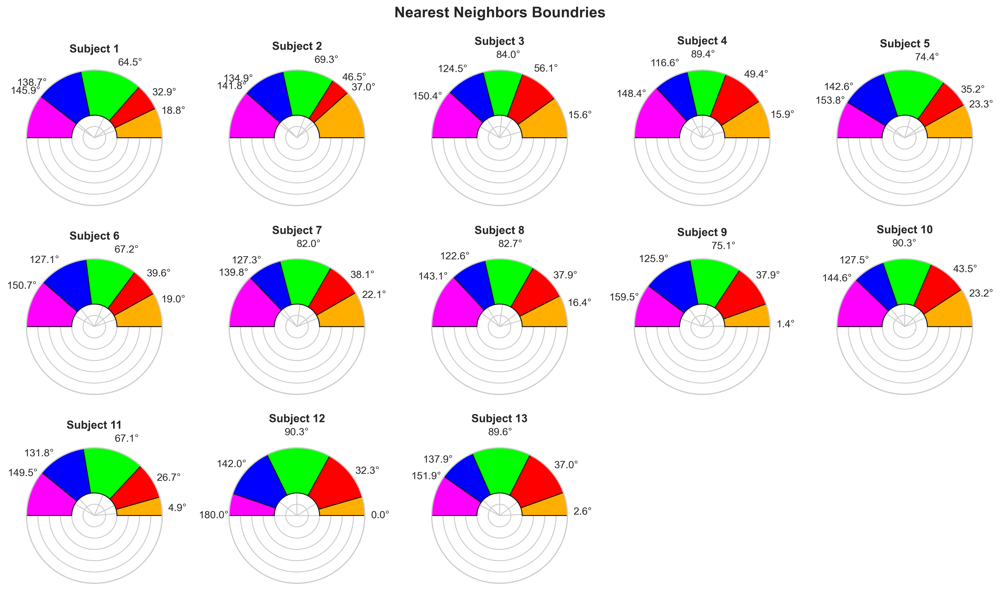

In [58]:
fig, ax = plt.subplots(3, 5, figsize=(15, 9), subplot_kw=dict(polar=True), dpi = 300)
for subj in range(n_subjects):
    vizz_nn(calib_median[subj], ax=ax.flatten()[subj], title=f"Subject {subj+1}")

for i in range(13, 15):
    ax.flatten()[i].axis('off')

plt.suptitle("Nearest Neighbors Boundries", fontsize=16)

plt.tight_layout()
plt.show()

## Acc plot

In [59]:
# get all the 1sig column values where subj is some index
resp_df[resp_df["subj"] == "NaN"]["1sig"]

Series([], Name: 1sig, dtype: float64)

In [60]:
acc_result = np.zeros((n_subjects, 5))

for subj in range(n_subjects):
    acc_result[subj, 0] = np.nanmean(resp_df[resp_df["subj"] == subj]["1sig"]) * 100
    acc_result[subj, 1] = np.nanmean(resp_df[resp_df["subj"] == subj]["2sig"]) * 100
    acc_result[subj, 2] = np.nanmean(resp_df[resp_df["subj"] == subj]["nn_c"]) * 100
    acc_result[subj, 3] = np.unique(resp_correct_sigma[subj], return_counts=True)[1][-1]
    acc_result[subj, 4] = (np.unique(resp_correct_sigma[subj], return_counts=True)[1][-1]/2880) * 100

acc_df = pd.DataFrame(acc_result, columns=['1 sigma', '2 sigma', 'NN', 'too early', 'too early %'])
acc_df.index = subjects
acc_df.round(2)

,1 sigma,2 sigma,NN,too early,too early %
01,22.04,33.33,25.42,235.0,8.16
02,44.27,63.95,43.43,19.0,0.66
03,25.85,40.66,30.83,183.0,6.35
04,20.74,33.52,31.61,37.0,1.28
05,37.06,50.44,42.27,743.0,25.80
06,32.89,55.34,48.96,4.0,0.14
07,25.03,37.51,23.78,5.0,0.17
08,17.99,28.51,25.61,1352.0,46.94
09,27.64,38.45,41.15,119.0,4.13
10,43.01,68.22,53.25,89.0,3.09


/tmp/ipykernel_2283030/111722804.py:57: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


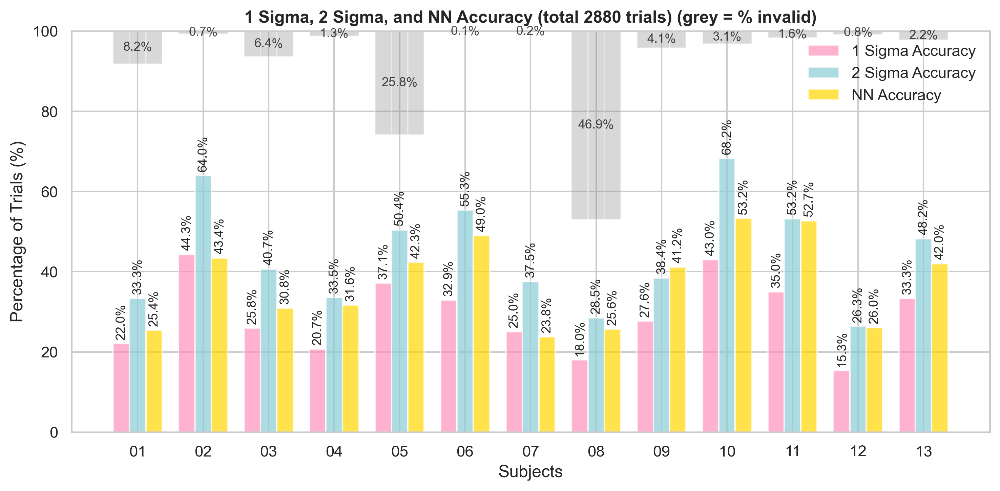

In [61]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

bar_width = 0.25  # Adjusting the bar width to accommodate 3 bars
x = np.arange(len(subjects))

# Bars for 1 sigma, 2 sigma, and NN percentages
bars_1_sigma = ax.bar(x - bar_width, acc_df['1 sigma'], bar_width, label='1 Sigma Accuracy', color='#FF90BC', alpha=0.7)
bars_2_sigma = ax.bar(x, acc_df['2 sigma'], bar_width, label='2 Sigma Accuracy', color='#8ACDD7', alpha=0.7)
bars_nn = ax.bar(x + bar_width, acc_df['NN'], bar_width, label='NN Accuracy', color='#FFD700', alpha=0.7)

# Overlay gray segments for 'too early' trials from the top
for idx, subject in enumerate(subjects):
    ax.bar(idx - bar_width, acc_df['too early %'][subject], bottom=100 - acc_df['too early %'][subject], color='gray', alpha=0.3, width=bar_width)
    ax.bar(idx, acc_df['too early %'][subject], bottom=100 - acc_df['too early %'][subject], color='gray', alpha=0.3, width=bar_width)
    ax.bar(idx + bar_width, acc_df['too early %'][subject], bottom=100 - acc_df['too early %'][subject], color='gray', alpha=0.3, width=bar_width)

# Adding text labels on the bars for 1 sigma, 2 sigma, and NN
for bars in [bars_1_sigma, bars_2_sigma, bars_nn]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + 1,
            f'{height:.1f}%',
            ha='center',
            va='bottom',
            fontsize=9,
            # rotate it
            rotation=90
        )

# Adding text labels for 'too early' on top
for idx, subject in enumerate(subjects):
    too_early_height = acc_df['too early %'][subject]
    total_height = 100
    ax.text(
        idx,
        total_height - too_early_height / 2,
        f'{too_early_height:.1f}%',
        ha='center',
        va='center',
        fontsize=9,
        color='black',
        alpha=0.7,
    )

# Labeling
ax.set_xlabel('Subjects')
ax.set_ylabel('Percentage of Trials (%)')
ax.set_title('1 Sigma, 2 Sigma, and NN Accuracy (total 2880 trials) (grey = % invalid)')
ax.set_xticks(x)
ax.set_xticklabels(subjects)
ax.set_ylim(0, 100)
# remove the bacground on legend
ax.legend(loc='upper right', frameon=False)

plt.tight_layout()
plt.show()


/tmp/ipykernel_2283030/2652669042.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Accuracy', y='Percentage', data=acc_melted, inner='box', palette='pastel', ax=ax)


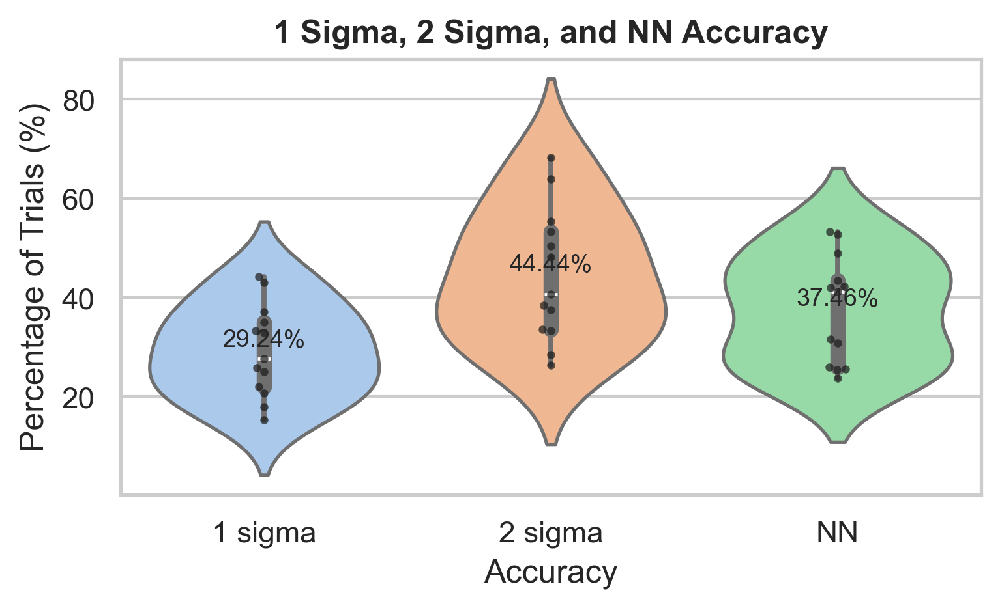

In [62]:
# violin plot the 1 sigma, 2 sigma, and NN accuracy
fig, ax = plt.subplots(figsize=(5, 3))

# Melt the DataFrame to the long format
acc_melted = acc_df.melt(value_vars=['1 sigma', '2 sigma', 'NN'], var_name='Accuracy', value_name='Percentage')

# Create the violin plot
sns.violinplot(x='Accuracy', y='Percentage', data=acc_melted, inner='box', palette='pastel', ax=ax)

# # Overlay the swarm plot
sns.swarmplot(x='Accuracy', y='Percentage', data=acc_melted, color='k', size=3, alpha=0.7, ax=ax)

# Add text to the mean of each category
for idx, acc in enumerate(['1 sigma', '2 sigma', 'NN']):
    mean_val = acc_df[acc].mean()
    ax.text(idx, mean_val, f'{mean_val:.2f}%', ha='center', va='bottom', fontsize=9)

# Labeling
ax.set_xlabel('Accuracy')
ax.set_ylabel('Percentage of Trials (%)')
ax.set_title('1 Sigma, 2 Sigma, and NN Accuracy')
plt.show()

## Covariate relationship

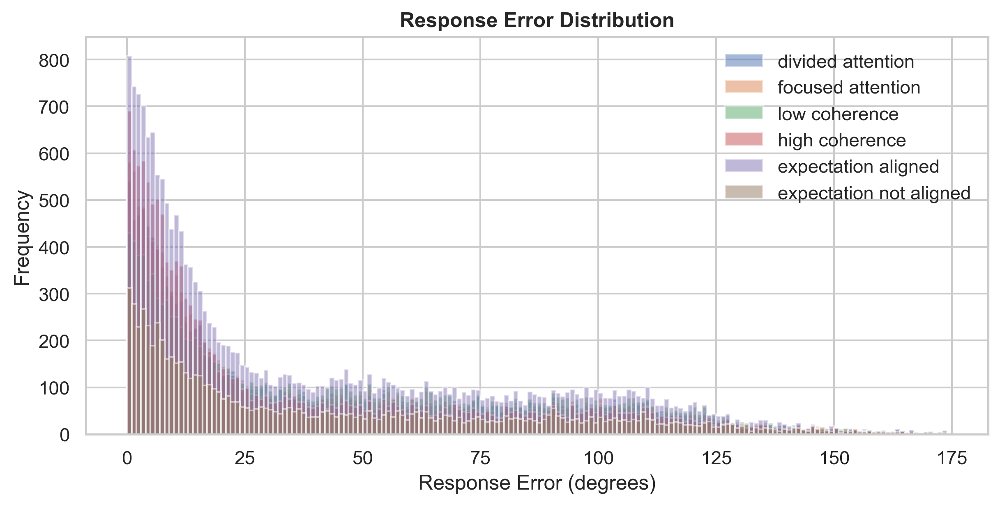

In [63]:
# plotting from resp_df
plt.figure(figsize=(8, 4), dpi=300)

resp_df[resp_df["att"] == -1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="divided attention")
resp_df[resp_df["att"] == 1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="focused attention")
resp_df[resp_df["coh"] == -1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="low coherence")
resp_df[resp_df["coh"] == 1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="high coherence")
resp_df[resp_df["exp_al"] == 1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="expectation aligned")
resp_df[resp_df["exp_al"] == 0]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="expectation not aligned")

plt.xlabel("Response Error (degrees)")
plt.ylabel("Frequency")
plt.title("Response Error Distribution")
plt.legend()
plt.show()

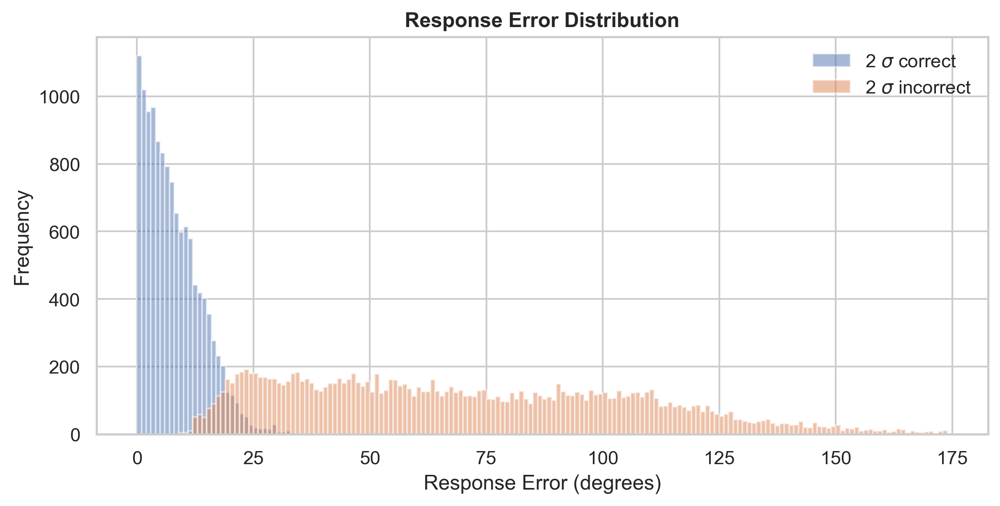

In [64]:
plt.figure(figsize=(8, 4), dpi=300)
resp_df[resp_df["2sig"] == 1]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="2 $\sigma$ correct")
resp_df[resp_df["2sig"] == 0]["resp_err"].hist(bins=np.arange(0,175,1), alpha=0.5, label="2 $\sigma$ incorrect")

plt.legend()

plt.xlabel("Response Error (degrees)")
plt.ylabel("Frequency")
plt.title("Response Error Distribution")
plt.legend()
plt.show()

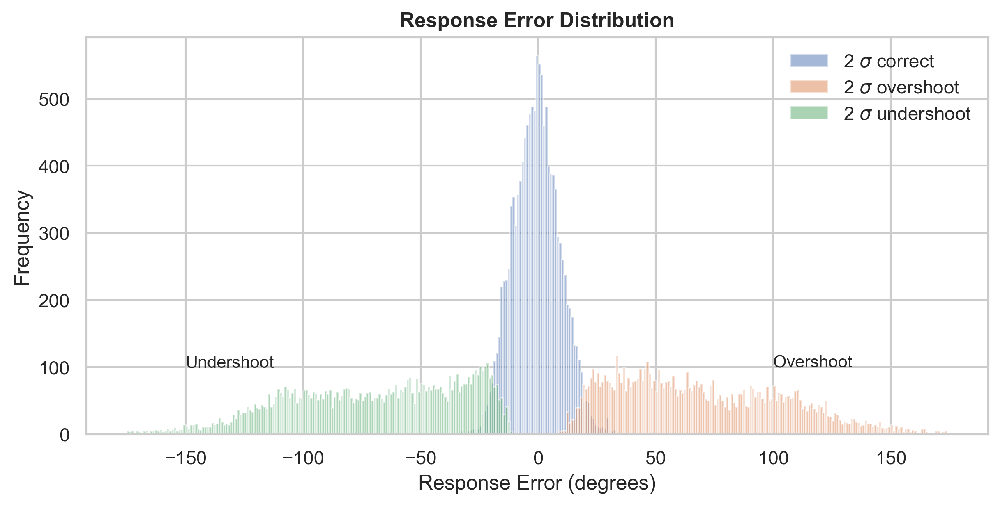

In [65]:
plt.figure(figsize=(8, 4), dpi=300)
resp_df[resp_df["2sig"] == 1]["v_err"].hist(bins=np.arange(-175,175,1), alpha=0.5, label="2 $\sigma$ correct")

resp_df[(resp_df["2sig"] == 0) & (resp_df["dir"] == "higher")]["v_err"].hist(bins=np.arange(-175,175,1), alpha=0.5, label="2 $\sigma$ overshoot")
resp_df[(resp_df["2sig"] == 0) & (resp_df["dir"] == "lower")]["v_err"].hist(bins=np.arange(-175,175,1), alpha=0.5, label="2 $\sigma$ undershoot")

# put label that -ve means undershoot and +ve means overshoot
plt.text(-150, 100, "Undershoot", fontsize=10)
plt.text(100, 100, "Overshoot", fontsize=10)

plt.legend()

plt.xlabel("Response Error (degrees)")
plt.ylabel("Frequency")
plt.title("Response Error Distribution")
plt.legend()
plt.show()

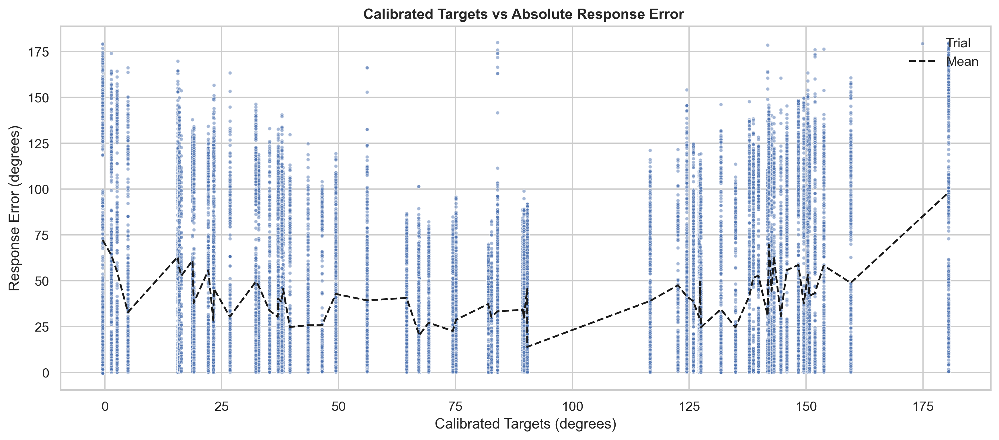

In [66]:

sns.scatterplot(data=resp_df[["t_calib", "resp_err"]], x="t_calib", y="resp_err", alpha=0.5, marker='.', label="Trial")

# plot the average resp err line
plt.plot(sorted(resp_df["t_calib"].unique()), resp_df["resp_err"].groupby(resp_df["t_calib"]).mean(), 'k--', label="Mean")

plt.xlabel("Calibrated Targets (degrees)")
plt.ylabel("Response Error (degrees)")
plt.title("Calibrated Targets vs Absolute Response Error ")
plt.legend( loc='upper right' )

plt.show()

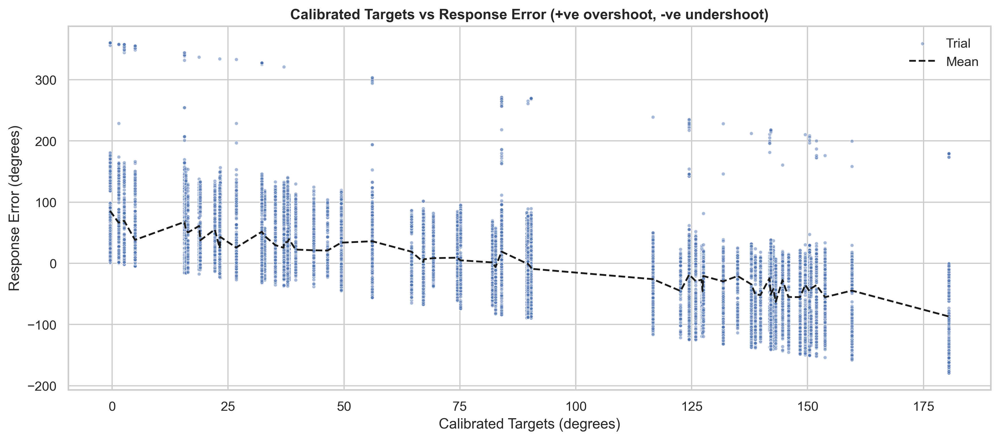

In [67]:

sns.scatterplot(data=resp_df[["t_calib", "v_err"]], x="t_calib", y="v_err", alpha=0.5, marker='.', label="Trial")

# plot the average resp err line
plt.plot(sorted(resp_df["t_calib"].unique()), resp_df["v_err"].groupby(resp_df["t_calib"]).mean(), 'k--', label="Mean")

plt.xlabel("Calibrated Targets (degrees)")
plt.ylabel("Response Error (degrees)")
plt.title("Calibrated Targets vs Response Error (+ve overshoot, -ve undershoot)")
plt.legend( loc='upper right' )

plt.show()

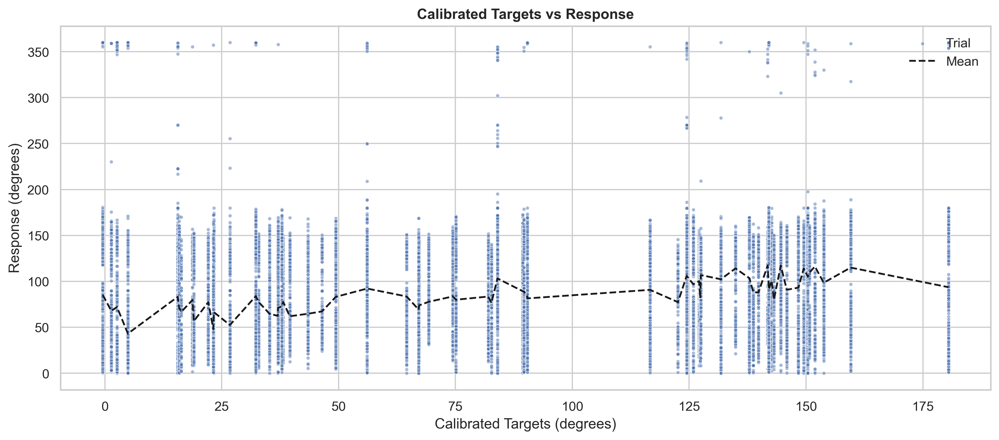

In [68]:

sns.scatterplot(data=resp_df[["t_calib", "resp"]], x="t_calib", y="resp", alpha=0.5, marker='.', label="Trial")

# plot the average resp err line
plt.plot(sorted(resp_df["t_calib"].unique()), resp_df["resp"].groupby(resp_df["t_calib"]).mean(), 'k--', label="Mean")

plt.xlabel("Calibrated Targets (degrees)")
plt.ylabel("Response (degrees)")
plt.title("Calibrated Targets vs Response")

plt.legend( loc='upper right' )
plt.show()

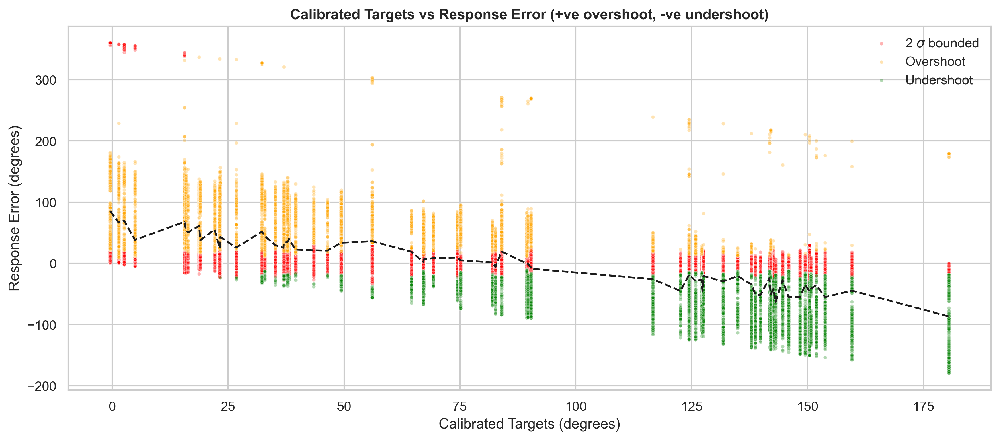

In [69]:
# sns.scatterplot(data=resp_df[["t_calib", "v_err"]], x="t_calib", y="v_err", alpha=0.5, marker='.', c=resp_df["2sig"], cmap="coolwarm")

sns.scatterplot(data=resp_df[resp_df["2sig"] == 1][["t_calib", "v_err"]], x="t_calib", y="v_err", alpha=0.3, marker='.', c="red", label="2 $\sigma$ bounded")
sns.scatterplot(data=resp_df[(resp_df["2sig"] == 0) & (resp_df["dir"] == "higher")][["t_calib", "v_err"]], x="t_calib", y="v_err", alpha=0.3, marker='.', c="orange", label="Overshoot")
sns.scatterplot(data=resp_df[(resp_df["2sig"] == 0) & (resp_df["dir"] == "lower")][["t_calib", "v_err"]], x="t_calib", y="v_err", alpha=0.3, marker='.', c="green", label="Undershoot")

# plot the average resp err line
plt.plot(sorted(resp_df["t_calib"].unique()), resp_df["v_err"].groupby(resp_df["t_calib"]).mean(), 'k--')

plt.xlabel("Calibrated Targets (degrees)")
plt.ylabel("Response Error (degrees)")
plt.title("Calibrated Targets vs Response Error (+ve overshoot, -ve undershoot)")
# plt.legend( loc='upper right' )

plt.show()

## Over trial

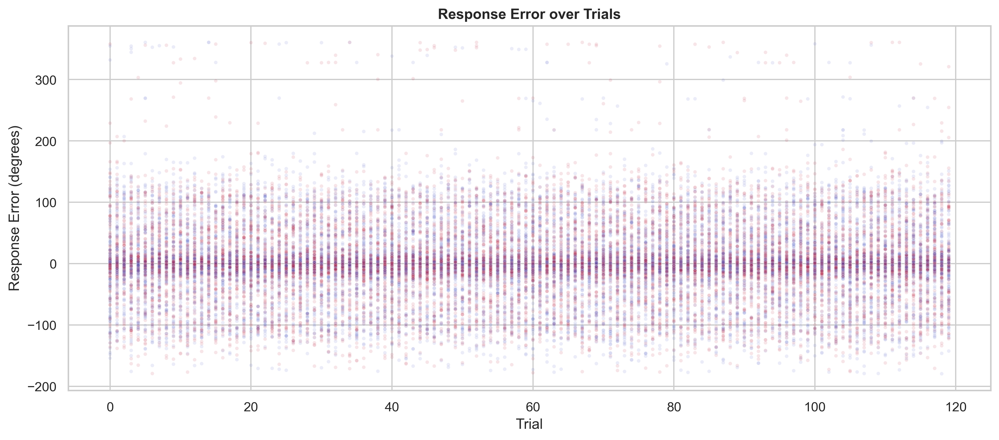

In [70]:
# Group by trial and plot the trials on the x axis and v_err on the y axis
sns.scatterplot(data=resp_df[["trial", "v_err"]], x="trial", y="v_err", alpha=0.1, marker='.', c=resp_df["att"], cmap="coolwarm")

plt.xlabel("Trial")
plt.ylabel("Response Error (degrees)")
plt.title("Response Error over Trials")
# plt.legend( loc='upper right' )
plt.show()

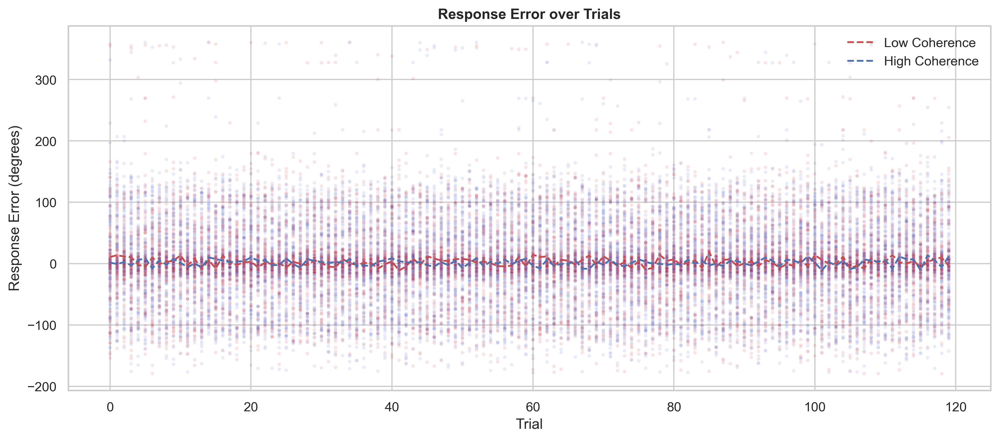

In [71]:
# Group by trial and plot the trials on the x axis and v_err on the y axis
sns.scatterplot(data=resp_df[["trial", "v_err"]], x="trial", y="v_err", alpha=0.1, marker='.', c=resp_df["coh"], cmap="coolwarm")

# plot high and low coherance mean over trials
plt.plot(sorted(resp_df["trial"].unique()), resp_df[resp_df["coh"] == -1]["v_err"].groupby(resp_df["trial"]).mean(), 'r--', label="Low Coherence")
plt.plot(sorted(resp_df["trial"].unique()), resp_df[resp_df["coh"] == 1]["v_err"].groupby(resp_df["trial"]).mean(), 'b--', label="High Coherence")

plt.xlabel("Trial")
plt.ylabel("Response Error (degrees)")
plt.title("Response Error over Trials")
plt.legend()
plt.show()

In [72]:
coherence.shape

(13, 4, 6, 120)

<Axes: xlabel='trial', ylabel='v_err'>

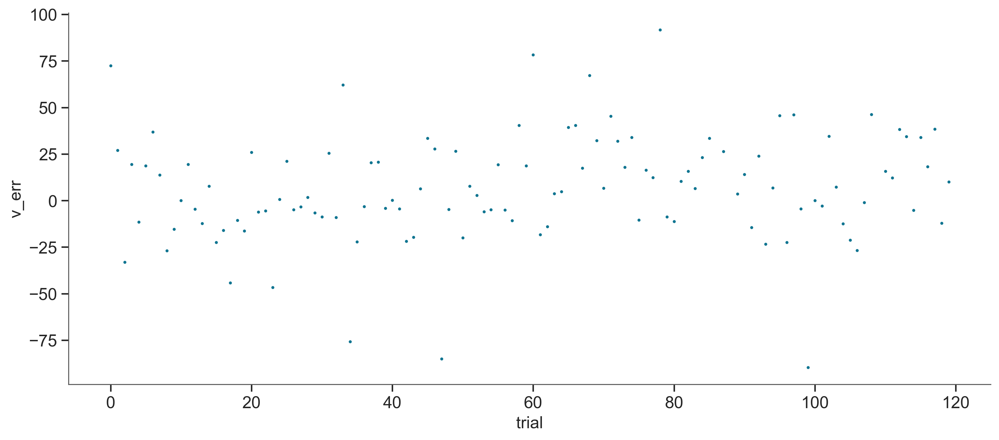

In [113]:
subj, sess, run = 9, 1, 3

p_data = resp_df.copy()
p_data = resp_df[(resp_df["subj"] == subj) & (resp_df["sess"] == sess) & (resp_df["run"]==run)]

sns.scatterplot(data=p_data[["trial", "v_err"]], x="trial", y="v_err", alpha=1, marker='.')

In [114]:
resp_df

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,dir
0,0,0,0,0,159,145.877462,150.877772,5.000310,5.000310,145.877462,145.877462,1.0,1.0,1.0,-1,1,1,higher
1,0,0,0,1,123,138.718044,127.920427,10.797617,-10.797617,145.877462,138.718044,1.0,1.0,1.0,1,1,0,lower
2,0,0,0,2,51,32.872185,131.003103,98.130917,98.130917,145.877462,138.718044,0.0,0.0,0.0,1,1,0,higher
3,0,0,0,3,159,145.877462,144.775174,1.102288,-1.102288,145.877462,145.877462,1.0,1.0,1.0,-1,1,1,lower
4,0,0,0,4,15,18.752776,142.791565,124.038789,124.038789,145.877462,145.877462,0.0,0.0,0.0,-1,-1,0,higher
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37435,12,3,5,115,51,37.048176,160.967904,123.919728,123.919728,NaN,151.890213,0.0,0.0,0.0,1,1,0,higher
37436,12,3,5,116,15,2.591583,37.650337,35.058754,35.058754,NaN,37.048176,0.0,0.0,0.0,-1,1,0,higher
37437,12,3,5,117,159,151.890213,85.831991,66.058222,-66.058222,NaN,89.645622,0.0,0.0,0.0,1,-1,0,lower
37438,12,3,5,118,123,137.879638,154.102492,16.222854,16.222854,NaN,151.890213,0.0,1.0,0.0,-1,-1,0,higher


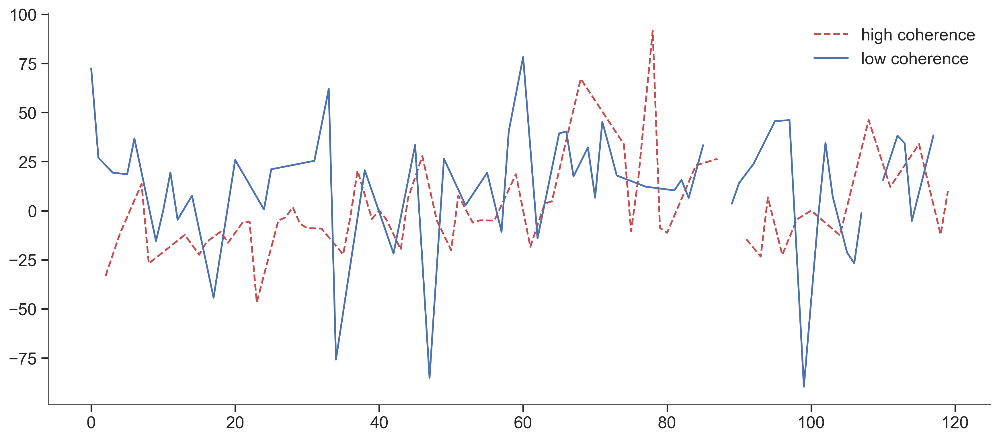

In [ ]:
# Group by exp_al

grouped = resp_df.groupby("exp_al")

# select only subject 1 and session 1 and run 1
subj, sess, run = 9, 1, 3
p_data = resp_df.copy()
p_data = resp_df[(resp_df["subj"] == subj) & (resp_df["sess"] == sess) & (resp_df["run"]==run)]

p_data_high = p_data[p_data["coh"] == 1]
p_data_low = p_data[p_data["coh"] == -1]

# plot the average line accross all trials
plt.plot(sorted(p_data_high["trial"].unique()), p_data_high["v_err"].groupby(p_data_high["trial"]).mean(), 'r--', label="high coherence")
plt.plot(sorted(p_data_low["trial"].unique()), p_data_low["v_err"].groupby(p_data_low["trial"]).mean(), 'b-', label="low coherence")

plt.legend()

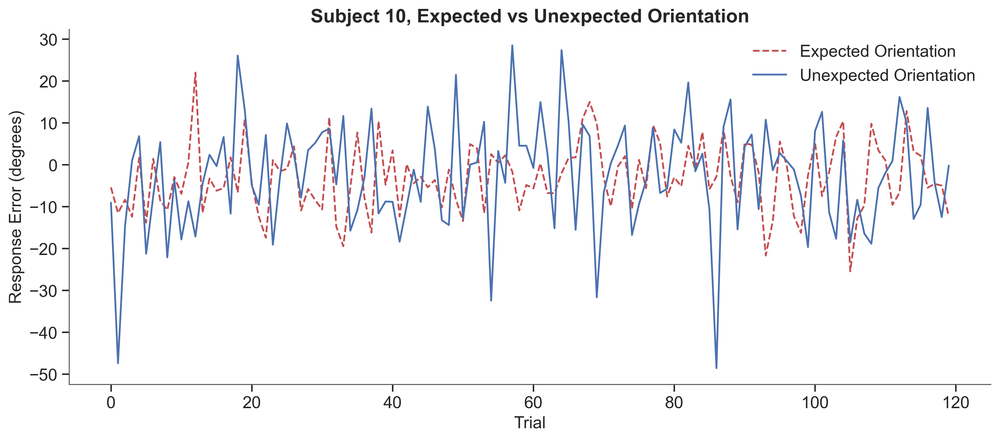

In [127]:
# Group by exp_al

grouped = resp_df.groupby("exp_al")

# select only subject 1 and session 1 and run 1
subj, sess, run = 9, 1, 3
p_data = resp_df.copy()
# p_data = resp_df[(resp_df["subj"] == subj) & (resp_df["sess"] == sess) & (resp_df["run"]==run)]
p_data = resp_df[(resp_df["subj"] == subj)]

p_data_high = p_data[p_data["exp_al"] == 1]
p_data_low = p_data[p_data["exp_al"] == 0]

# plot the average line accross all trials
plt.plot(sorted(p_data_high["trial"].unique()), p_data_high["v_err"].groupby(p_data_high["trial"]).mean(), 'r--', label="Expected Orientation")
plt.plot(sorted(p_data_low["trial"].unique()), p_data_low["v_err"].groupby(p_data_low["trial"]).mean(), 'b-', label="Unexpected Orientation")

plt.title("Subject 10, Expected vs Unexpected Orientation")
plt.ylabel("Response Error (degrees)")
plt.xlabel("Trial")

plt.legend()

In [ ]:
# Group by exp_al

grouped = resp_df.groupby("exp_al")

# select only subject 1 and session 1 and run 1
subj, sess, run = 9, 1, 3
p_data = resp_df.copy()
# p_data = resp_df[(resp_df["subj"] == subj) & (resp_df["sess"] == sess) & (resp_df["run"]==run)]
p_data = resp_df[(resp_df["subj"] == subj) & (resp_df["run"]==run)]

p_data_high = p_data[p_data["exp"] == 1]
p_data_low = p_data[p_data["coh"] == -1]

# plot the average line accross all trials
plt.plot(sorted(p_data_high["trial"].unique()), p_data_high["v_err"].groupby(p_data_high["trial"]).mean(), 'r--', label="high coherence")
plt.plot(sorted(p_data_low["trial"].unique()), p_data_low["v_err"].groupby(p_data_low["trial"]).mean(), 'b-', label="low coherence")

plt.title("Subject 10, Run 4, High and Low Coherence")
plt.ylabel("Response Error (degrees)")
plt.xlabel("Trial")

plt.legend()

## GLM

In [75]:
import pymc as pm
import arviz as az
az.style.use("arviz-doc")

In [76]:
def fit_glm(data_from):

    # Convert y to radians if needed, since von Mises requires radians
    x = np.radians(data_from["targ_calib"].values) - np.pi
    y = np.radians(data_from["resp"].values) - np.pi

    with pm.Model() as model:
        # Priors for the intercept and slope
        intercept = pm.Normal("intercept", mu=0, sigma=1)
        slope = pm.Normal("slope", mu=0, sigma=1)
        kappa = pm.HalfNormal("kappa", sigma=1)

        # Regression equation for the angle
        mu = intercept + slope * x

        # Define the von Mises likelihood
        # y_obs = pm.Normal("y_obs", mu=mu, sigma=kappa, observed=y)
        y_obs = pm.VonMises("y_obs", mu=mu, kappa=kappa, observed=y)

        # Sample from the posterior
        trace = pm.sample(chains=4, tune=1000, draws=1000)

    return x, y, trace

In [77]:
c_x, c_y, correct_trace = fit_glm(correct_two_sigma_trials)

NameError: name 'correct_two_sigma_trials' is not defined

In [ ]:
i_x, i_y, incorrect_trace = fit_glm(incorrect_two_sigma_trials)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, slope, kappa]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5 seconds.


/tmp/ipykernel_3211582/93059221.py:20: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


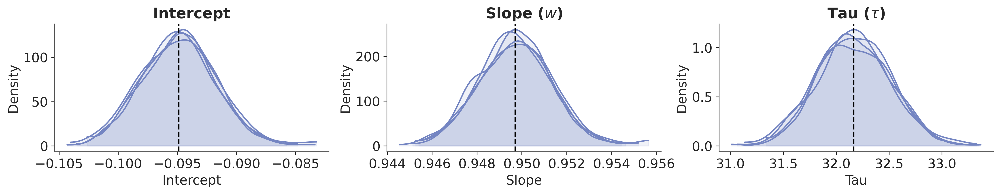

In [ ]:
variables = ["intercept", "slope", "kappa"]
titles = ["Intercept", "Slope ($w$)", "Tau ($\\tau$)"]
x_labels = ["Intercept", "Slope", "Tau"]

fig, ax = plt.subplots(1, 3, figsize=(15, 3), dpi=300)
for i, var in enumerate(variables):

    data = correct_trace.posterior[var].values
    
    for j in range(4):
        az.plot_dist(data[j], color="#7485C2", fill_kwargs={"alpha": 0.1}, ax=ax[i])

    # plot a center mean line
    ax[i].axvline(data.mean(), color="k", linestyle="--")

    ax[i].set_xlabel(x_labels[i])
    ax[i].set_ylabel("Density")
    ax[i].set_title(titles[i])

plt.tight_layout()


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

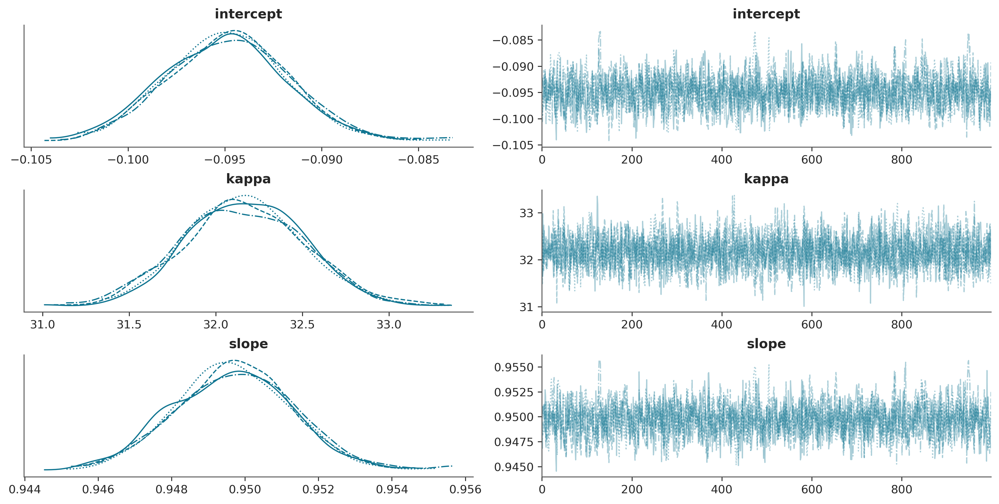

In [ ]:
az.plot_trace(correct_trace)
correct_trace

In [ ]:
az.summary(correct_trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,-0.095,0.003,-0.101,-0.089,0.000,0.000,1606.0,1632.0,1.0
kappa,32.166,0.343,31.542,32.806,0.007,0.005,2312.0,2550.0,1.0
slope,0.950,0.002,0.947,0.953,0.000,0.000,1704.0,1759.0,1.0


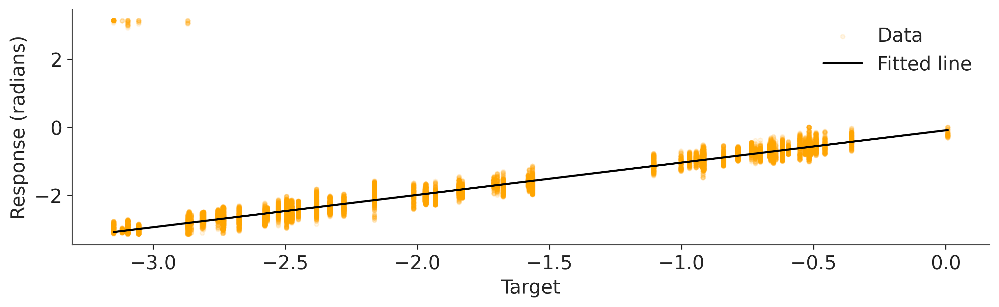

In [ ]:
x = c_x
y = c_y

x_values = np.linspace(x.min(), x.max(), 100)
y_values = correct_trace.posterior["intercept"].mean().values + correct_trace.posterior["slope"].mean().values * x_values

plt.figure(figsize=(10, 3), dpi=300)
plt.scatter(x, y, label="Data", alpha=0.1, marker=".", c="orange")
plt.plot(x_values, y_values, label="Fitted line", color="k")

plt.xlabel("Target")
plt.ylabel("Response (radians)")
plt.legend(loc="upper right")
plt.show()


In [ ]:
max(y), min(y), min(x), max(x)

(3.141491459499873,
 -3.141592653589793,
 -3.1495330344003682,
 0.007893773898385081)

In [ ]:
import seaborn as sns

/tmp/ipykernel_3211582/3707154231.py:20: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


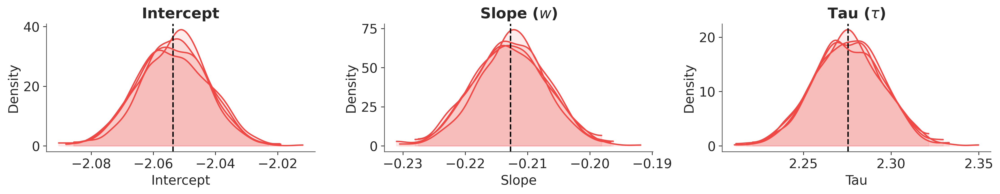

In [ ]:
variables = ["intercept", "slope", "kappa"]
titles = ["Intercept", "Slope ($w$)", "Tau ($\\tau$)"]
x_labels = ["Intercept", "Slope", "Tau"]

fig, ax = plt.subplots(1, 3, figsize=(15, 3), dpi=300)
for i, var in enumerate(variables):

    data = incorrect_trace.posterior[var].values
    
    for j in range(4):
        az.plot_dist(data[j], color="#EF4743", fill_kwargs={"alpha": 0.1}, ax=ax[i])

    # plot a center mean line
    ax[i].axvline(data.mean(), color="k", linestyle="--")

    ax[i].set_xlabel(x_labels[i])
    ax[i].set_ylabel("Density")
    ax[i].set_title(titles[i])

plt.tight_layout()


array([[<Axes: title={'center': 'intercept'}>,
        <Axes: title={'center': 'intercept'}>],
       [<Axes: title={'center': 'kappa'}>,
        <Axes: title={'center': 'kappa'}>],
       [<Axes: title={'center': 'slope'}>,
        <Axes: title={'center': 'slope'}>]], dtype=object)

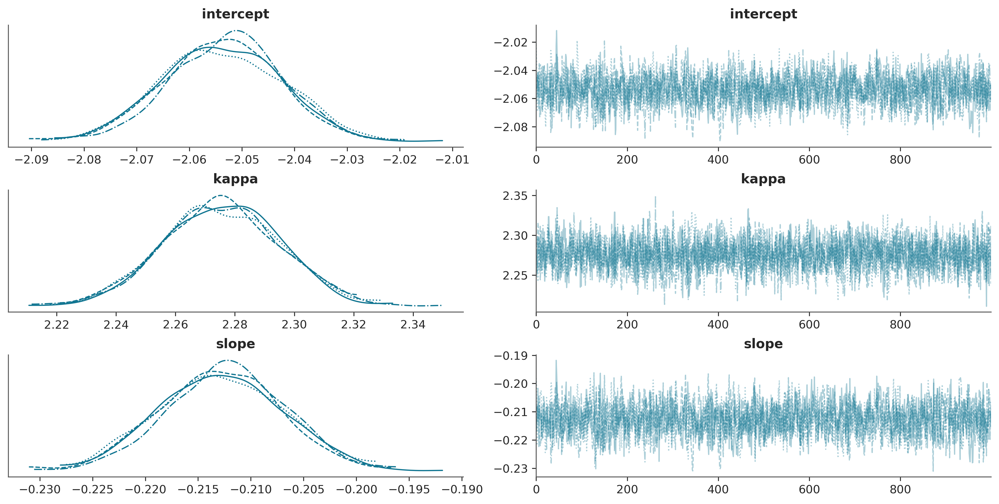

In [ ]:

az.plot_trace(incorrect_trace, plot_kwargs={"color": "k", "alpha": 1})
# plt.tight_layout()

In [ ]:
az.summary(incorrect_trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,-2.054,0.011,-2.074,-2.034,0.0,0.0,1781.0,1885.0,1.0
kappa,2.275,0.019,2.239,2.311,0.0,0.0,2551.0,2306.0,1.0
slope,-0.213,0.006,-0.223,-0.202,0.0,0.0,1732.0,1876.0,1.0


In [ ]:
az.summary(correct_trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,-1.080,0.986,-2.093,-0.088,0.491,0.376,6.0,139.0,1.73
kappa,16.568,15.592,0.944,32.574,7.764,5.945,6.0,145.0,1.73
slope,-0.644,1.594,-2.251,0.953,0.794,0.608,6.0,154.0,1.73


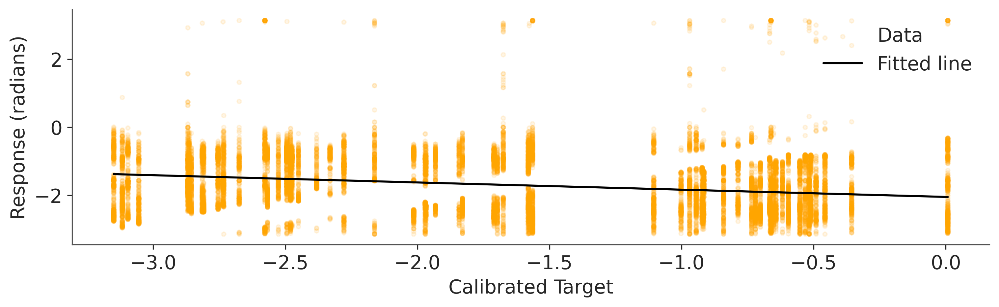

In [ ]:
x = i_x
y = i_y

x_values = np.linspace(x.min(), x.max(), 100)
y_values = incorrect_trace.posterior["intercept"].mean().values + incorrect_trace.posterior["slope"].mean().values * x_values

plt.figure(figsize=(10, 3), dpi=300)
plt.scatter(x, y, label="Data", alpha=0.1, marker=".", c="orange")
plt.plot(x_values, y_values, label="Fitted line", color="k")

plt.xlabel("Calibrated Target")
plt.ylabel("Response (radians)")
plt.legend(loc="upper right")
plt.show()


In [ ]:
# Given the mu and kappa, plot a von mises distribution

def plot_vm(mu, kappa, color, label):
    x = np.linspace(-np.pi, np.pi, 1000)
    y = np.exp(kappa * np.cos(x - mu)) / (2 * np.pi * np.i0(kappa))
    plt.plot(x, y, color=color, label=label)
    plt.fill_between(x, y, color=color, alpha=0.4)
    plt.xlim(-np.pi, np.pi)
    plt.ylim(0, 1)
    plt.xlabel("Angle (radians)")
    plt.ylabel("Probability density")
    plt.title("Emission Models' Distributions at (x = 1)")


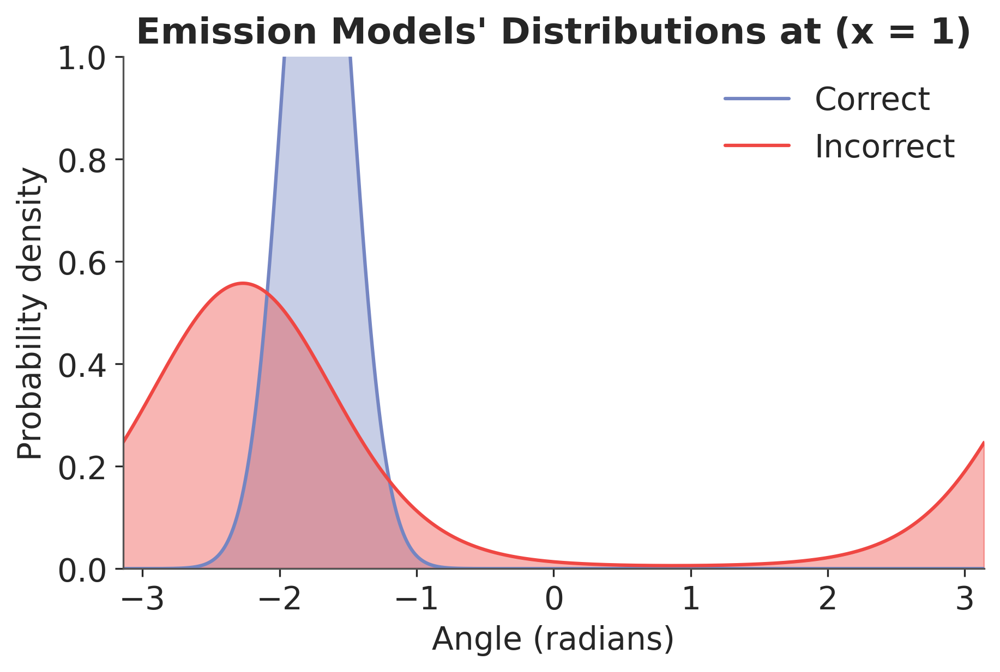

In [ ]:
fig = plt.figure(figsize=(6, 4), dpi=300)
# Incorrect
# Correct
plot_vm(-0.644 -1.080, 16.568, "#7485C2", "Correct")
plot_vm(-0.213 -2.054, 2.275, "#EF4743", "Incorrect")

plt.legend()

# # put correct and incorrect in the legend
# plt.legend(["Incorrect", "Correct"])
# # make the legend use the same color as the plot
# plt.legend(["Incorrect", "Correct"], facecolor='white')